<a href="https://www.kaggle.com/code/alexandrkolomijec/tps-september22?scriptVersionId=105682291" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

Tabular Playground Series September 2022. This project is about predicting sales of the books in different countries.

# Preparing for the EDA

### Import basic libraries.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

### Set style for graphs

In [2]:
params = {'axes.facecolor': '#F8F7E9',
 'axes.edgecolor': 'black',
 'axes.labelcolor': 'black',
 'figure.facecolor': '#F8F7E9',
 'grid.color': '#b0b0b0',
 'grid.linestyle': '-',
 'text.color': 'black',
 'xtick.color': 'black',
 'ytick.color': 'black',
 'xtick.direction': 'out',
 'ytick.direction': 'out',
 'axes.titlesize': 'Large',
 'axes.labelsize': 'Large',
 'patch.edgecolor': 'white',
 'patch.force_edgecolor': True,
 'xtick.bottom': True,
 'xtick.top': False,
 'ytick.left': True,
 'ytick.right': False,
 'axes.spines.right': False,
 'axes.spines.top': False}

sns.set_theme(style = 'whitegrid',rc = params)
sns.color_palette("colorblind")

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

### Download data sets.

In [3]:
train_df = pd.read_csv( "../input/tabular-playground-series-sep-2022/train.csv", parse_dates=['date'])

test_df = pd.read_csv("../input/tabular-playground-series-sep-2022/test.csv", parse_dates=['date'])

# EDA

Let's see what we have here.

In [4]:
display(train_df.head())
display(train_df.shape)
display(test_df.head())
display(test_df.shape)

,row_id,date,country,store,product,num_sold
0,0,2017-01-01,Belgium,KaggleMart,Kaggle Advanced Techniques,663
1,1,2017-01-01,Belgium,KaggleMart,Kaggle Getting Started,615
2,2,2017-01-01,Belgium,KaggleMart,Kaggle Recipe Book,480
3,3,2017-01-01,Belgium,KaggleMart,Kaggle for Kids: One Smart Goose,710
4,4,2017-01-01,Belgium,KaggleRama,Kaggle Advanced Techniques,240


(70128, 6)

,row_id,date,country,store,product
0,70128,2021-01-01,Belgium,KaggleMart,Kaggle Advanced Techniques
1,70129,2021-01-01,Belgium,KaggleMart,Kaggle Getting Started
2,70130,2021-01-01,Belgium,KaggleMart,Kaggle Recipe Book
3,70131,2021-01-01,Belgium,KaggleMart,Kaggle for Kids: One Smart Goose
4,70132,2021-01-01,Belgium,KaggleRama,Kaggle Advanced Techniques


(17520, 5)

Data sets have a very small amount of features, only 4 <br/>
They are: <br/>1.date <br/>
2.country <br/>
3.store <br/>
4.product <br/>

In [5]:
train_country = list(train_df['country'].unique())
train_store = list(train_df['store'].unique())
train_product = list(train_df['product'].unique())
test_country = list(train_df['country'].unique())
test_store = list(train_df['store'].unique())
test_product = list(train_df['product'].unique())

In [6]:
print(f'Unique values for country in the train df: {train_country}')
print(f'Unique values for store in the train df: {train_store}')
print(f'Unique values for product in the train df: {train_product}')

print('\n')

print(f'Unique values for country in the test df: {test_country}')
print(f'Unique values for store in the test df: {test_store}')
print(f'Unique values for product in the test df: {test_product}')

Unique values for country in the train df: ['Belgium', 'France', 'Germany', 'Italy', 'Poland', 'Spain']
Unique values for store in the train df: ['KaggleMart', 'KaggleRama']
Unique values for product in the train df: ['Kaggle Advanced Techniques', 'Kaggle Getting Started', 'Kaggle Recipe Book', 'Kaggle for Kids: One Smart Goose']


Unique values for country in the test df: ['Belgium', 'France', 'Germany', 'Italy', 'Poland', 'Spain']
Unique values for store in the test df: ['KaggleMart', 'KaggleRama']
Unique values for product in the test df: ['Kaggle Advanced Techniques', 'Kaggle Getting Started', 'Kaggle Recipe Book', 'Kaggle for Kids: One Smart Goose']


Train df and test df have same unique values for all features. 

Let's check the first one and the last one date values for the train df.

In [7]:
display(train_df['date'].min())
display(train_df['date'].max())

Timestamp('2017-01-01 00:00:00')

Timestamp('2020-12-31 00:00:00')

Train df includes dates from 2017 to 2020. <br/>
Let's check test df.


In [8]:
display(test_df['date'].min())
display(test_df['date'].max())

Timestamp('2021-01-01 00:00:00')

Timestamp('2021-12-31 00:00:00')

Test df is for 2021 year only.

Now we will check them for the missing values.

In [9]:
for i in train_df.columns:
    
    num = train_df[i].isnull().sum()
    print(f'Number of missing values in train_df for {i} column is: {num}')

Number of missing values in train_df for row_id column is: 0
Number of missing values in train_df for date column is: 0
Number of missing values in train_df for country column is: 0
Number of missing values in train_df for store column is: 0
Number of missing values in train_df for product column is: 0
Number of missing values in train_df for num_sold column is: 0


In [10]:
for i in test_df.columns:
    
    num = test_df[i].isnull().sum()
    print(f'Number of missing values in test_df for {i} column is: {num}')

Number of missing values in test_df for row_id column is: 0
Number of missing values in test_df for date column is: 0
Number of missing values in test_df for country column is: 0
Number of missing values in test_df for store column is: 0
Number of missing values in test_df for product column is: 0


Both data sets doesn't have missing values. We can continue with EDA.

Let's check sales distribution of products in each country.

<AxesSubplot:xlabel='product', ylabel='num_sold'>

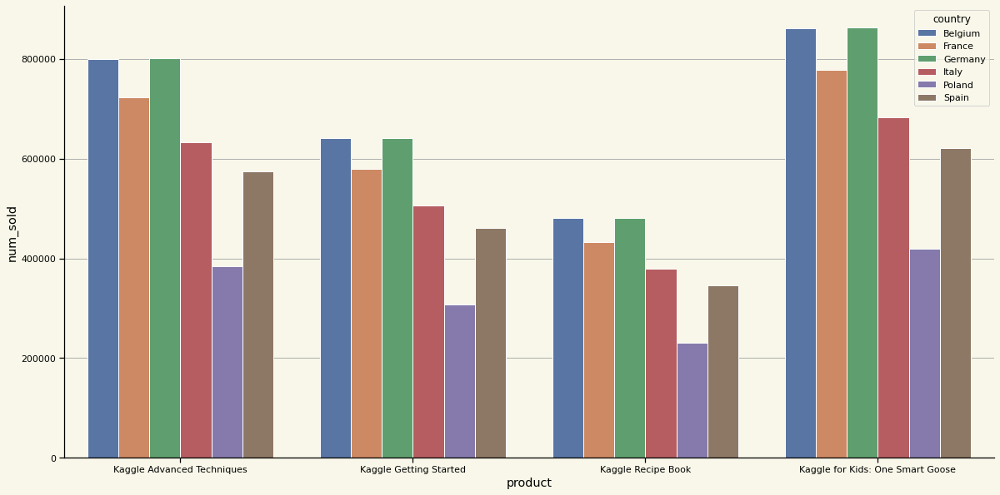

In [11]:
plt.figure(figsize=(20,10))
sns.barplot(data=train_df.groupby(['country','product'])['num_sold'].sum().reset_index(),x='product',y='num_sold', hue='country')

We can see the same pattern for all four products: Belgium and Germany have equally the highest sales. France is on the second plase, Italy is on the third, Spain is on the fourth and the last one is Poland. <br/>
Kaggle for kids: One Smart Goose is the best selling books and Kaggle Recipe Book is the worst selling one.

Now, let's compare distribution of sales in each countrie for each year.

<AxesSubplot:xlabel='year', ylabel='num_sold'>

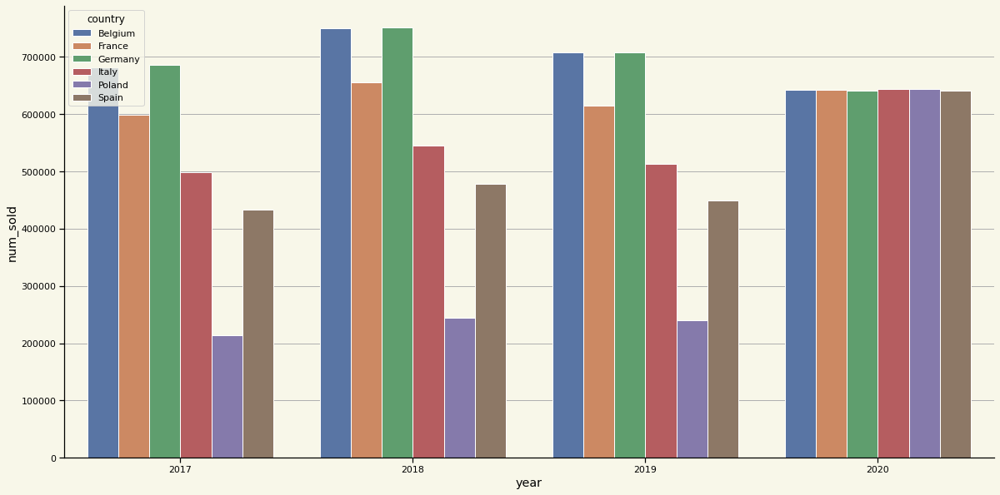

In [12]:
train_df['year'] = train_df['date'].dt.year
plt.figure(figsize=(20,10))
sns.barplot(data=train_df.groupby(['year','country'])['num_sold'].sum().reset_index(),x='year',y='num_sold', hue = 'country')

As we can see, sales does have almost the same ratio for years 2017 - 2019. In 2020 we can see a significant change: distribution between countries became almost equal. We can assume, that for the test set, where we'll have 2021, the distribution of sales will be the same as for 2020.

For the next analysis we need to create some new features for our data sets. We will dissaggregate our 'date' feature into years, month, weeks, days, day of the year and day of the week. 

In [13]:
train_df['year'] = train_df['date'].dt.year
train_df['quarter'] = train_df['date'].dt.quarter
train_df['month'] = train_df['date'].dt.month
train_df['week'] = train_df['date'].dt.isocalendar().week
train_df['day'] = train_df['date'].dt.day
train_df['dayofweek'] = train_df['date'].dt.dayofweek
train_df['dayofyear'] = train_df['date'].dt.dayofyear

test_df['year'] = test_df['date'].dt.year
test_df['quarter'] = test_df['date'].dt.quarter
test_df['month'] = test_df['date'].dt.month
test_df['week'] = test_df['date'].dt.isocalendar().week
test_df['day'] = test_df['date'].dt.day
test_df['dayofweek'] = test_df['date'].dt.dayofweek
test_df['dayofyear'] = test_df['date'].dt.dayofyear

Let's start with year's sales for each combination in ('country', 'store', 'product').

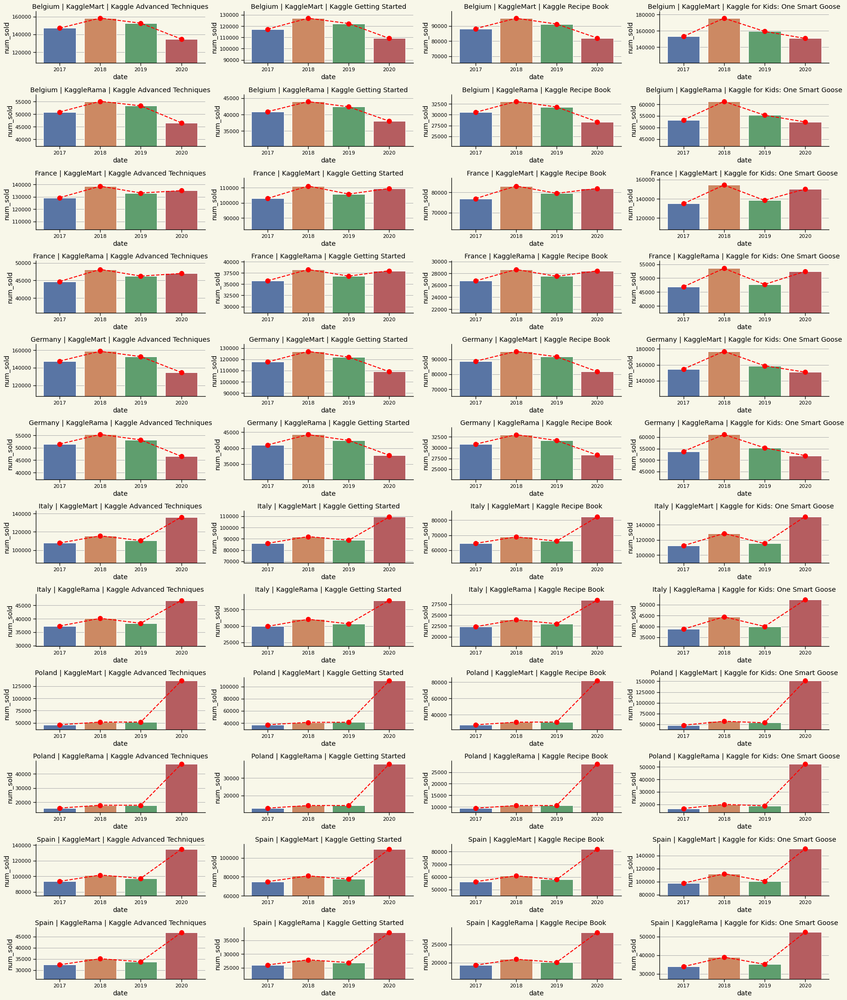

In [14]:
fig, ax = plt.subplots(12,4,figsize=(25,30))
ax = ax.flatten()
for i, (combination,df) in enumerate(train_df.groupby(['country', 'store', 'product'])):
    data = df.groupby(df.date.dt.year)['num_sold'].sum().reset_index()
    sns.barplot(data=data, x='date', y='num_sold', ax=ax[i])
    ax[i].plot(
        ax[i].get_xticks(), data.num_sold,
        color='red', linestyle='--', marker='.',
        markersize=20, linewidth=2
    )
    lims = ax[i].get_ylim()
    ax[i].set_ylim(data.num_sold.min()*0.8, lims[1])
    ax[i].set_title(' | '.join(combination))
plt.tight_layout()

As we can see, year's sales have seasonality. For all countries sales rises from 2017 to 2018 and decreases from 2018 to 2019. In the year 2020 Germany and Belgium shows significant decrease in sales while in France we can see a little increase of sales. In 2020 Italy, Spain, and Poland shows drastic increase of sales and that explains equality in sales distribution for 2020.

Next will be quarter of the year.

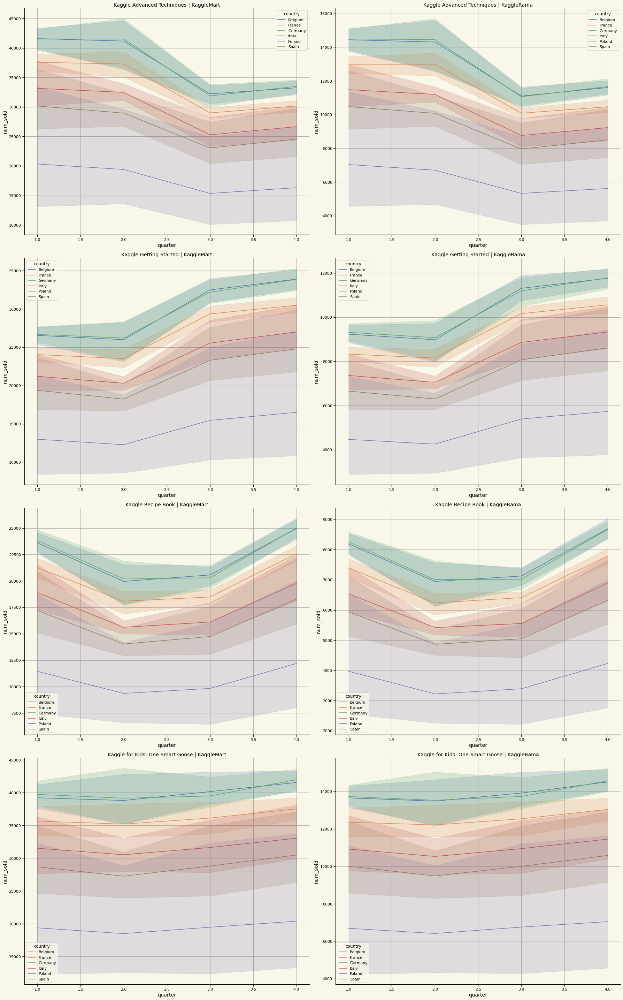

In [15]:
fig,ax = plt.subplots(4,2,figsize=(25,40))
ax = ax.flatten()
for i, (combo, df) in enumerate(train_df.groupby(['product','store'])):
    datad = df.groupby(['country','year','quarter'])['num_sold'].sum().reset_index()
    sns.lineplot(data=datad, x='quarter', y='num_sold', hue = 'country', ax=ax[i])
    
    
    ax[i].set_title(' | '.join(combo))
plt.tight_layout()
    


We can see seasonality for quarters. All countries have the same sales behaviour which differs only by a coefficient.

1 product: sales are best in 1 quarter <br/>
2 product: sales go down from 1 quarter to 2 quarter and than rise up to 4 quarter <br/>
3 product: sales go down from 1 to 2 quarter, the remain plain from 2 to 3 quarter and then rise up from 3 to 4 quarter <br/>
4 product: slightly rise in sales from 2 to 4 quarter.

Let's check monthly sales.

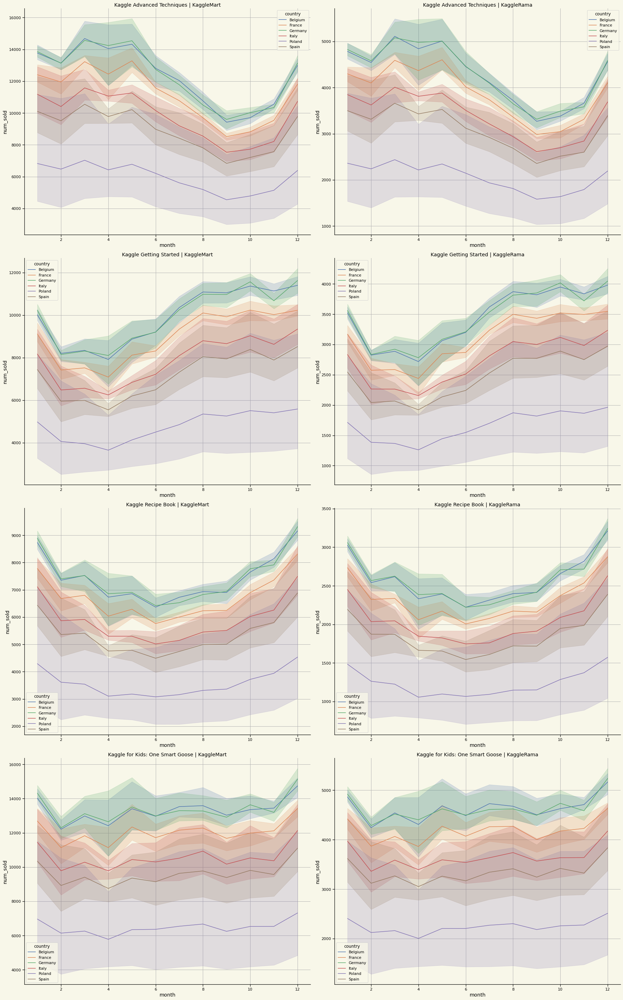

In [16]:
fig,ax = plt.subplots(4,2,figsize=(25,40))
ax = ax.flatten()
for i, (combo, df) in enumerate(train_df.groupby(['product','store'])):
    datad = df.groupby(['country', 'year','month'])['num_sold'].sum().reset_index()
    sns.lineplot(data=datad, x='month', y='num_sold', hue = 'country', ax=ax[i])
    
    
    ax[i].set_title(' | '.join(combo))
plt.tight_layout()

Monthly sales repeat seasonality of quarter sales with better detalization <br/>
1 product: sales are best for 3-5 month and worse for 9-11 month <br/>
2 product: sales worse for 3-5 month and than rise from 6 to 12 month (especially from 6 to 8) <br/>
3 product: sales go down from 1 to 6 month, and then rise from 6 to 12 month <br/>
4 product: slightly downfall from 1 to 2 month and  rise in sales from 11 to 12 month.

Let's do the week's sales.

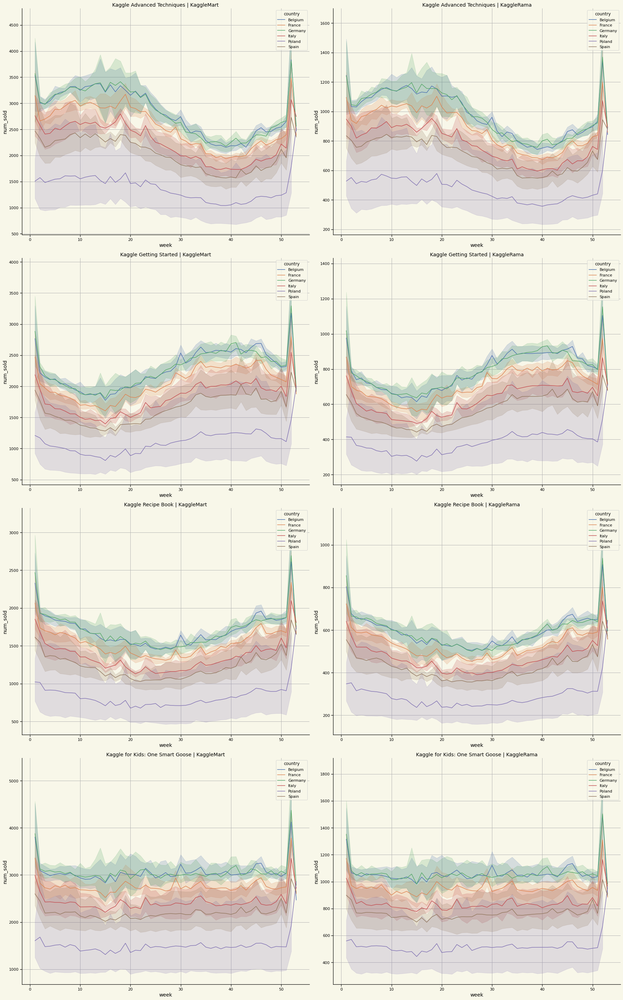

In [17]:
fig,ax = plt.subplots(4,2,figsize=(25,40))
ax = ax.flatten()
for i, (combo, df) in enumerate(train_df.groupby(['product','store'])):
    datad = df.groupby(['country','year','week'])['num_sold'].sum().reset_index()
    sns.lineplot(data=datad, x='week', y='num_sold', hue = 'country', ax=ax[i])
    
    
    ax[i].set_title(' | '.join(combo))
plt.tight_layout()

Week's sale distribution copy month's distribution with even better detalization. 51 week shows increased amount of sales for all products.

Next is day of month.

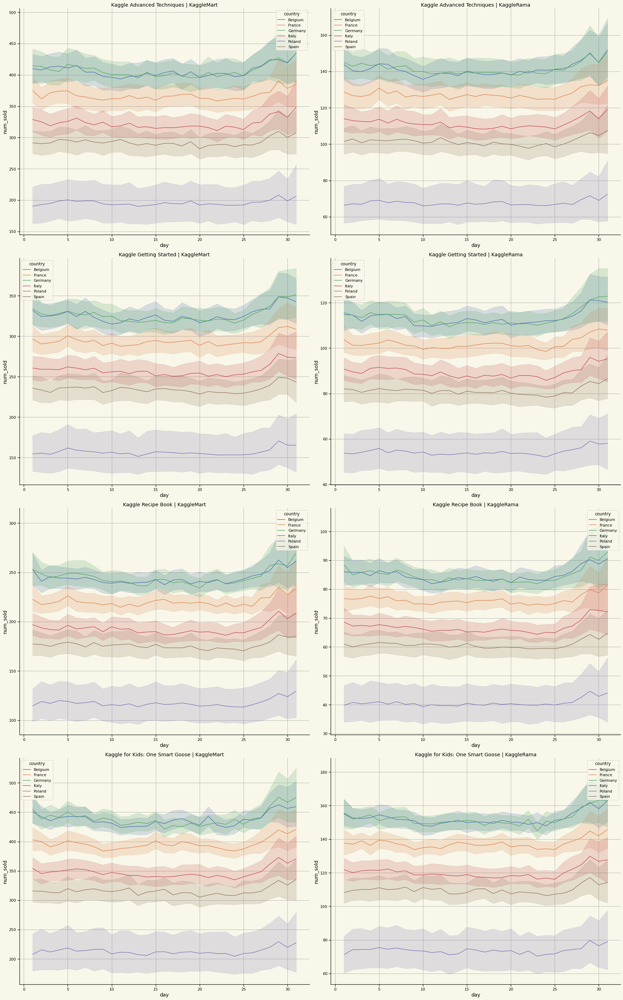

In [18]:
fig,ax = plt.subplots(4,2,figsize=(25,40))
ax = ax.flatten()
for i, (combo, df) in enumerate(train_df.groupby(['product','store'])):
    datad = df.groupby(['country','year', 'month','day'])['num_sold'].sum().reset_index()
    sns.lineplot(data=datad, x='day', y='num_sold', hue = 'country', ax=ax[i])
    
    
    ax[i].set_title(' | '.join(combo))
plt.tight_layout()

We can observe a little increased amount of sales for days from 25 to 29. Then goes a little decrease for the day 30 and again increase for the day 31.

Let's check dependance of sales on day of year.

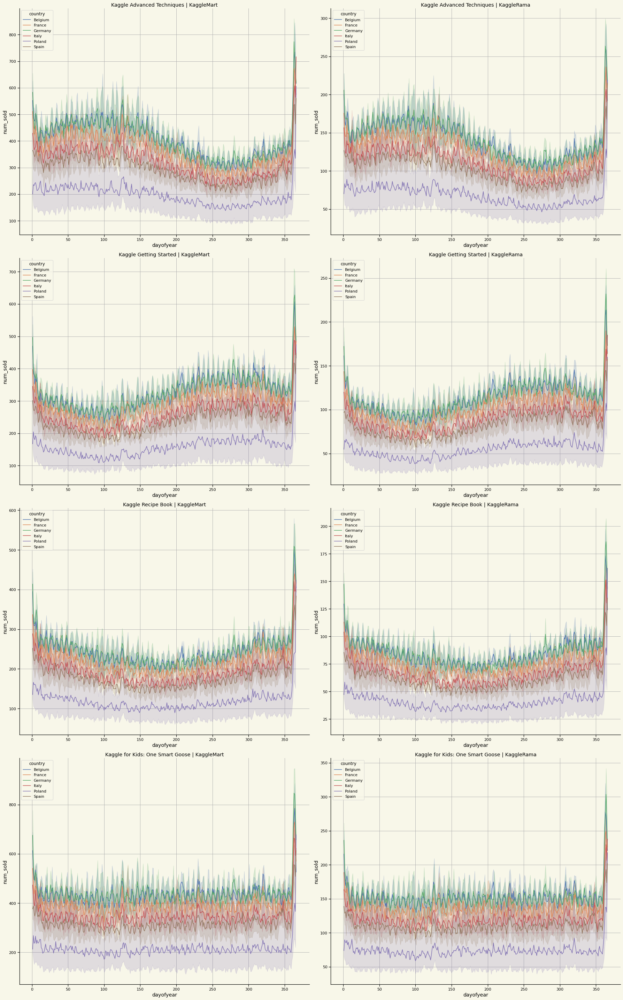

In [19]:
fig,ax = plt.subplots(4,2,figsize=(25,40))
ax = ax.flatten()
for i, (combo, df) in enumerate(train_df.groupby(['product','store'])):
    datad = df.groupby(['country','year','dayofyear'])['num_sold'].sum().reset_index()
    sns.lineplot(data=datad, x='dayofyear', y='num_sold', hue = 'country', ax=ax[i])
    
    
    ax[i].set_title(' | '.join(combo))
plt.tight_layout()

Copy of the month and week distributions with better details. Last 6 days and the first 8 days are the most important. There is interesting peak in sales for days 125 and 126 also.

Next one is dependence of sales distrinution on the day of week.

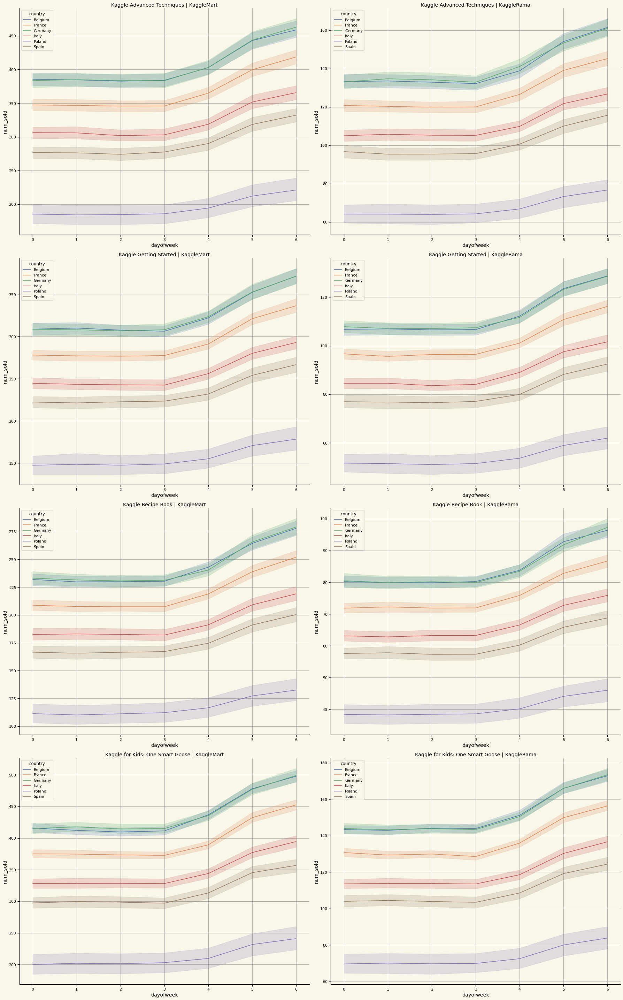

In [20]:
fig,ax = plt.subplots(4,2,figsize=(25,40))
ax = ax.flatten()
for i, (combo, df) in enumerate(train_df.groupby(['product','store'])):
    datad = df.groupby(['country','year','month', 'week','dayofweek'])['num_sold'].sum().reset_index()
    sns.lineplot(data=datad, x='dayofweek', y='num_sold', hue = 'country', ax=ax[i])
    
    
    ax[i].set_title(' | '.join(combo))
plt.tight_layout()

Increase in sales from day 3 to day 6 for all products.

# Conclusion <br/>

We can highlight some important date features for the future predictions. <br/>
Year is important for predictions. We can see that sales have two year seasonality (except 2020). <br/>
Month, week, day of year have same seasonality with difference in it's detalization. We can choose one of them and encode it to cos/sin function.<br/>
Important days of the week are 4, 5 and 6 we will use it for our predictions. <br/>
Important days of the year are: 1, 2, 3, 4, 5, 6, 7, 8, 125, 125, 360, 361, 362, 363, 364, 365. <br/>
All other date features are not significant.


Now, let's check the distribution of sales of books by each year separately.

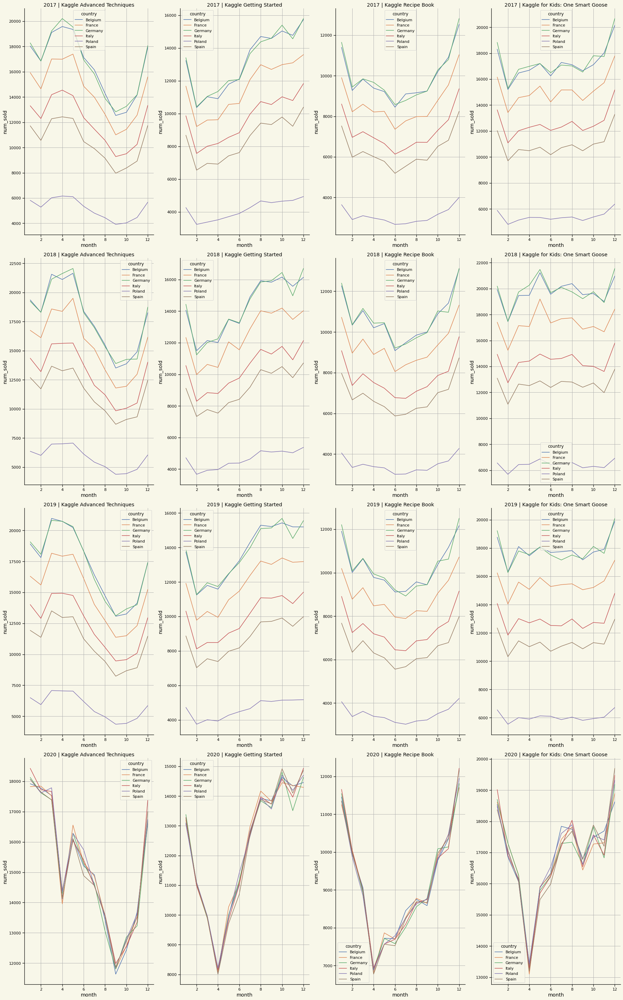

In [21]:
fig,ax = plt.subplots(4,4,figsize=(25,40))
ax = ax.flatten()
for i, (combo, df) in enumerate(train_df.groupby(['year','product'])):
    datad = df.groupby(['country','month'])['num_sold'].sum().reset_index()
    sns.lineplot(data=datad, x='month', y='num_sold', hue = 'country', ax=ax[i])
    
    
    ax[i].set_title(' | '.join(map(str,combo)))
plt.tight_layout()

Year 2020 is a big surprise. First, sales are equally distributed between countries. Second, there is a huge fall in sales between March and May. This fall is assumed to be due to COVID-19 pandemia. Such disbalance can affect our predictions so it is better to remove COVID data from our train set.

In [22]:
train_df_c = train_df.loc[~((train_df["date"] >= "2020-03-01") & (train_df["date"] < "2020-06-01"))]

# Feature exploration

We have 3 non-integer features: 'country', 'store', 'product'. Let's check the distribution of sales based on these features for the train set. We start with 'country'

In [23]:
country_weights = train_df.loc[train_df["date"] < "2020-01-01"].groupby("country")["num_sold"].sum()/(train_df.loc[train_df["date"] < "2020-01-01"]["num_sold"].sum())
country_weights

country
Belgium    0.218930
France     0.191360
Germany    0.219586
Italy      0.159383
Poland     0.071348
Spain      0.139393
Name: num_sold, dtype: float64

Prior to 2020 the highest sales were in Germany and Belgium while the smallest were in Poland. From the graphs above we can see, that sales behaviour is the same for all counties (exept Poland is little differs but within boundaries). We will use sales distribution of 2020 for our prediction.

In [24]:
country_weights2020 = train_df.loc[train_df["date"] >= "2020-01-01"].groupby("country")["num_sold"].sum()/(train_df.loc[train_df["date"] >= "2020-01-01"]["num_sold"].sum())
country_weights2020

country
Belgium    0.166528
France     0.166696
Germany    0.166257
Italy      0.167007
Poland     0.167162
Spain      0.166349
Name: num_sold, dtype: float64

Next is 'store' feature.

In [25]:
store_weights = train_df.groupby("store")["num_sold"].sum()/train_df["num_sold"].sum()
store_weights

store
KaggleMart    0.742515
KaggleRama    0.257485
Name: num_sold, dtype: float64

Let's check if this ratio is static

<AxesSubplot:xlabel='date', ylabel='num_sold'>

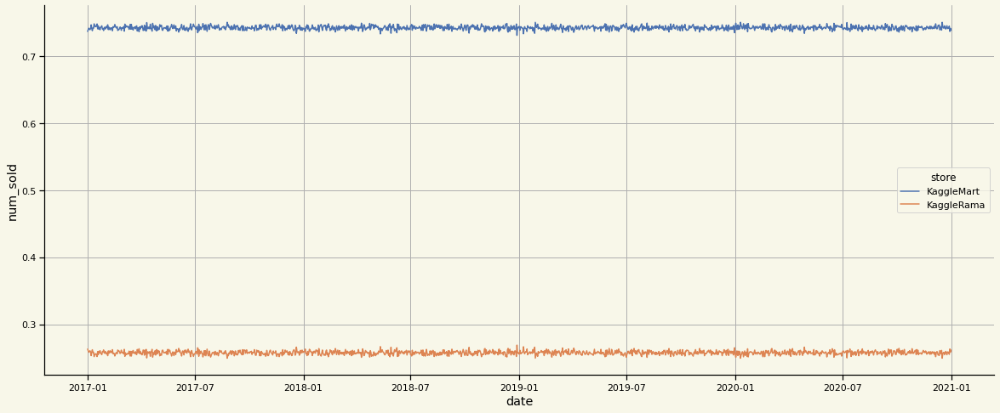

In [26]:
store_ratio = (train_df.groupby(['date','store'])['num_sold'].sum()/train_df.groupby(['date'])['num_sold'].sum()).reset_index()
plt.figure(figsize=(20,8))
sns.lineplot(data=store_ratio, x='date', y='num_sold', hue='store')


As we can see, store ratio remains the same for the whole time period. Let's check seasonality dependance. 

In [27]:
def plot_all(df):
    f,axes = plt.subplots(2,2,figsize=(20,15), sharex = True, sharey=True)
    f.tight_layout()
    for n,prod in enumerate(df["product"].unique()):
        plot_df = df.loc[df["product"] == prod]
        sns.lineplot(data=plot_df, x="date", y="num_sold", hue="country", style="store",ax=axes[n//2,n%2])
        axes[n//2,n%2].set_title("Product: "+str(prod))

In [28]:
def plot_adjusted_store(df):
    new_df = df.copy()
    weights = store_weights.loc["KaggleMart"] / store_weights
    for store in weights.index:
        new_df.loc[new_df["store"] == store, "num_sold"] = new_df.loc[new_df["store"] == store, "num_sold"] * weights[store]
    plot_all(new_df)

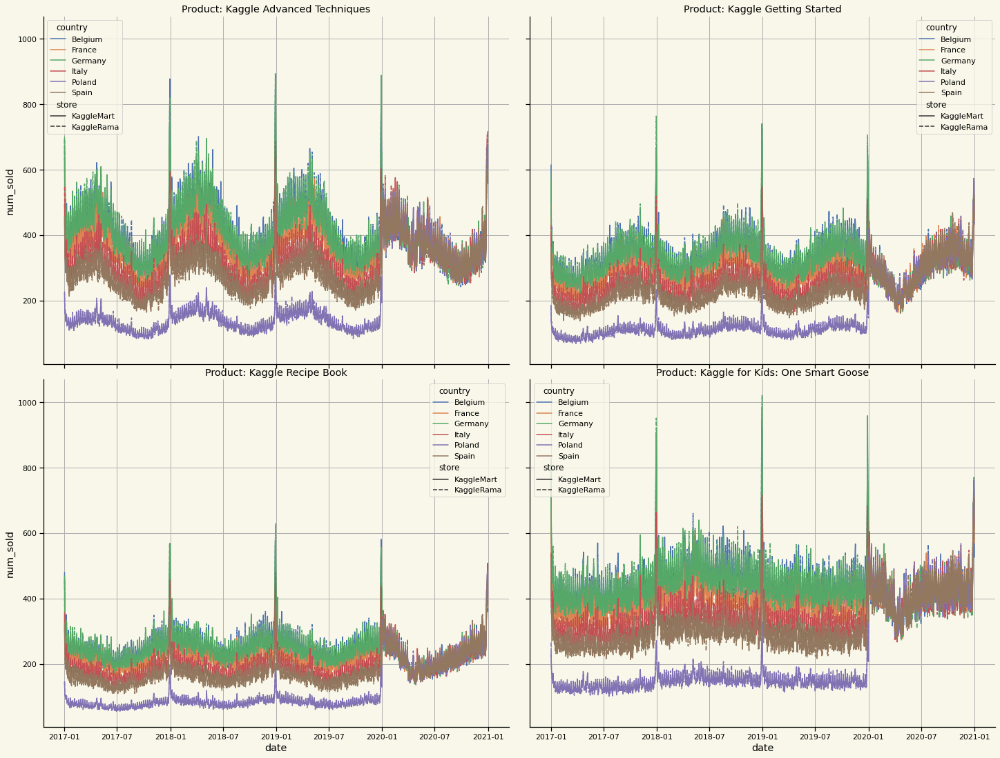

In [29]:
plot_adjusted_store(train_df)

Same pattern for both stores. We can use it in our predictions.

Next is 'product' feature.

In [30]:
product_df = train_df.groupby(["date","product"])["num_sold"].sum().reset_index()

In [31]:
product_ratio_df = product_df.pivot(index="date", columns="product", values="num_sold")
product_ratio_df = product_ratio_df.apply(lambda x: x/x.sum(),axis=1)
product_ratio_df = product_ratio_df.stack().rename("ratios").reset_index()
product_ratio_df.head(4)

,date,product,ratios
0,2017-01-01,Kaggle Advanced Techniques,0.277944
1,2017-01-01,Kaggle Getting Started,0.227462
2,2017-01-01,Kaggle Recipe Book,0.188900
3,2017-01-01,Kaggle for Kids: One Smart Goose,0.305693


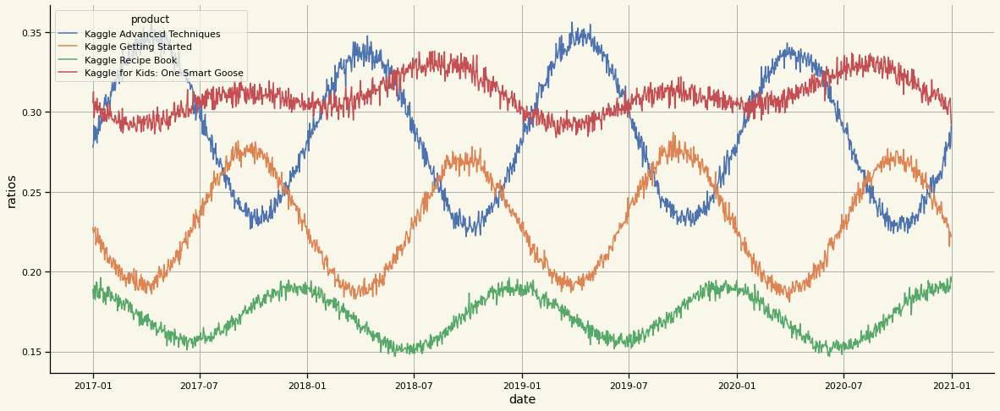

In [32]:
plt.figure(figsize=(20,8))
sns.lineplot(data = product_ratio_df, x="date", y="ratios", hue="product");

Product ratio depends on a date. We can see, that ratio distribution repeats every two year.

# Feature engineering

Here is the trick. We will group sales by date in train set. Then we perform feature engineering (add important dates to the new set). After that we predict sales by model (Ridge, Lasso or ElasticNet) and disaggregate sales by coefficient for 'country', 'store' and 'product'.

We start with transformation of the train_df_c.

In [33]:
train_df_c = train_df_c.groupby(["date"])["num_sold"].sum().reset_index()

Next, we transform test_df and create another dataframe consisting of dates

In [34]:
test_total_sales_df = test_df.groupby(["date"])["row_id"].first().reset_index().drop(columns="row_id")

test_total_sales_dates = test_total_sales_df[["date"]]

Now we apply feature engineering to our data sets. We need to extract from the data feature all important values (year, day of week, day of year, month).

In [35]:
def feature_eng(df):
   
    df["month"] = df["date"].dt.month
    df["month_sin"] = np.sin(df['month'] * (2 * np.pi / 12))
    df["month_cos"] = np.cos(df['month'] * (2 * np.pi / 12))
    df["day_of_week"] = df["date"].dt.dayofweek
    df["day_of_week"] = df["day_of_week"].apply(lambda x: 0 if x<=3 else(1 if x==4 else (2 if x==5 else (3))))
    df["dayofyear"] = df["date"].dt.dayofyear
    df['year'] = df['date'].dt.year
    df["important_dates"] = df["dayofyear"].apply(lambda x: x if x in [1,2,3,4,5,6,7,8,125,126,360,361,362,363,364,365] else 0)
    df = df.drop(columns = ['date', 'month', 'dayofyear'])
    
    df = pd.get_dummies(df, columns = ["important_dates", 'day_of_week'], drop_first=True)
    
   
    return df


In [36]:
train_df_c = feature_eng(train_df_c)
test_total_sales_df = feature_eng(test_total_sales_df)

In [37]:
train_df_c.head()

,num_sold,month_sin,month_cos,year,important_dates_1,important_dates_2,important_dates_3,important_dates_4,important_dates_5,important_dates_6,...,important_dates_126,important_dates_360,important_dates_361,important_dates_362,important_dates_363,important_dates_364,important_dates_365,day_of_week_1,day_of_week_2,day_of_week_3
0,15352,0.5,0.866025,2017,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,11578,0.5,0.866025,2017,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,10884,0.5,0.866025,2017,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,10445,0.5,0.866025,2017,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9795,0.5,0.866025,2017,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [38]:
test_total_sales_df.head()

,month_sin,month_cos,year,important_dates_1,important_dates_2,important_dates_3,important_dates_4,important_dates_5,important_dates_6,important_dates_7,...,important_dates_126,important_dates_360,important_dates_361,important_dates_362,important_dates_363,important_dates_364,important_dates_365,day_of_week_1,day_of_week_2,day_of_week_3
0,0.5,0.866025,2021,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0.5,0.866025,2021,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
2,0.5,0.866025,2021,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,0.5,0.866025,2021,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0.5,0.866025,2021,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


Now, we separate our data into X, y and X_test

In [39]:
X = train_df_c.drop('num_sold', axis = 1)
y = train_df_c['num_sold']
X_test = test_total_sales_df

Import linear models for prediction and apply one of them.

In [40]:
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
model = Ridge(alpha=0.00001,tol=1e-2, max_iter=1000000, random_state=0)
model.fit(X, y)
preds = model.predict(X_test)

test_total_sales_dates["num_sold"] = preds

Let's check the results.

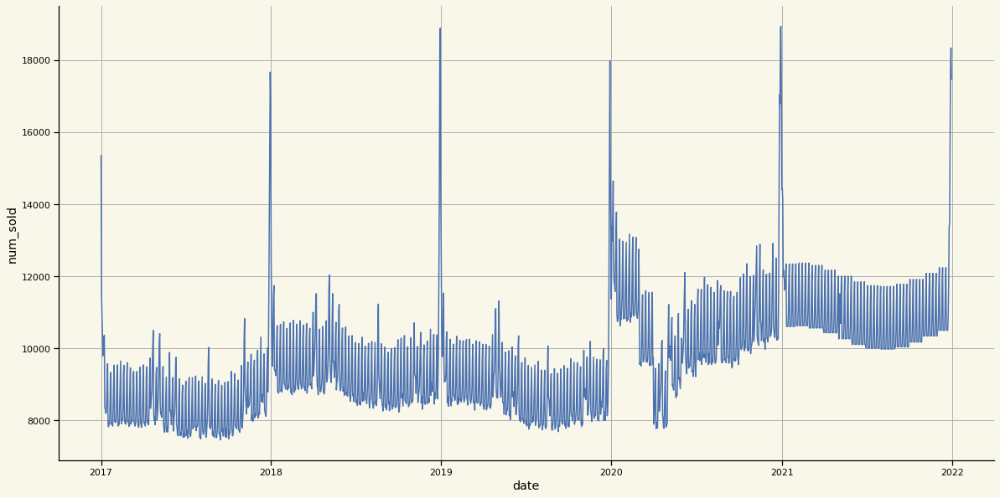

In [41]:
train_df_d = train_df.groupby(['date'])['num_sold'].sum().reset_index()
f,ax = plt.subplots(figsize=(20,10))
sns.lineplot(data = pd.concat([train_df_d ,test_total_sales_dates]).reset_index(drop=True), x="date", y="num_sold");

Looks good enough. Now we add product ratios. As was mentioned earlier products have 2 year seasonality, so we take ratios from year 2019 for our predictions.

In [42]:
product_ratio_2019 = product_ratio_df.loc[product_ratio_df["date"].dt.year == 2019].copy()
product_ratio_2019["mm-dd"] = product_ratio_2019["date"].dt.strftime('%m-%d')
product_ratio_2019 = product_ratio_2019.drop(columns="date")

test_product_ratio_df = test_df.copy()
test_product_ratio_df["mm-dd"] = test_product_ratio_df["date"].dt.strftime('%m-%d')

test_product_ratio_df = pd.merge(test_product_ratio_df,product_ratio_2019, how="left", on = ["mm-dd","product"])
test_product_ratio_df.head()

,row_id,date,country,store,product,year,quarter,month,week,day,dayofweek,dayofyear,mm-dd,ratios
0,70128,2021-01-01,Belgium,KaggleMart,Kaggle Advanced Techniques,2021,1,1,53,1,4,1,01-01,0.279273
1,70129,2021-01-01,Belgium,KaggleMart,Kaggle Getting Started,2021,1,1,53,1,4,1,01-01,0.230832
2,70130,2021-01-01,Belgium,KaggleMart,Kaggle Recipe Book,2021,1,1,53,1,4,1,01-01,0.188119
3,70131,2021-01-01,Belgium,KaggleMart,Kaggle for Kids: One Smart Goose,2021,1,1,53,1,4,1,01-01,0.301776
4,70132,2021-01-01,Belgium,KaggleRama,Kaggle Advanced Techniques,2021,1,1,53,1,4,1,01-01,0.279273


Merge test_df and sales data frame.

In [43]:
test_sub_df = pd.merge(test_df, test_total_sales_dates, how="left")
test_sub_df["ratios"] = test_product_ratio_df["ratios"]
test_sub_df.head()

,row_id,date,country,store,product,year,quarter,month,week,day,dayofweek,dayofyear,num_sold,ratios
0,70128,2021-01-01,Belgium,KaggleMart,Kaggle Advanced Techniques,2021,1,1,53,1,4,1,14407.717697,0.279273
1,70129,2021-01-01,Belgium,KaggleMart,Kaggle Getting Started,2021,1,1,53,1,4,1,14407.717697,0.230832
2,70130,2021-01-01,Belgium,KaggleMart,Kaggle Recipe Book,2021,1,1,53,1,4,1,14407.717697,0.188119
3,70131,2021-01-01,Belgium,KaggleMart,Kaggle for Kids: One Smart Goose,2021,1,1,53,1,4,1,14407.717697,0.301776
4,70132,2021-01-01,Belgium,KaggleRama,Kaggle Advanced Techniques,2021,1,1,53,1,4,1,14407.717697,0.279273


Now we create functon which will disaggregate our preicted sales.

In [44]:
def disaggregate_forecast(df):
    new_df = df.copy()
    
    stores_weights = train_df.groupby("store")["num_sold"].sum()/train_df["num_sold"].sum()
    country_weights = country_weights2020

    for country in country_weights.index:
        new_df.loc[(new_df["country"] == country), "num_sold"] = new_df.loc[(new_df["country"] == country), "num_sold"] *  country_weights[country]
        
    for store in store_weights.index:
        new_df.loc[new_df["store"] == store, "num_sold"] = new_df.loc[new_df["store"] == store, "num_sold"] * store_weights[store]
    
    #apply product weights (which is dependent on date)
    new_df["num_sold"] = new_df["num_sold"] * new_df["ratios"]
    new_df["num_sold"] = new_df["num_sold"].round()
    new_df = new_df.drop(columns=["ratios"])
    
    return new_df

In [45]:
final_df = disaggregate_forecast(test_sub_df)
final_df

,row_id,date,country,store,product,year,quarter,month,week,day,dayofweek,dayofyear,num_sold
0,70128,2021-01-01,Belgium,KaggleMart,Kaggle Advanced Techniques,2021,1,1,53,1,4,1,498.0
1,70129,2021-01-01,Belgium,KaggleMart,Kaggle Getting Started,2021,1,1,53,1,4,1,411.0
2,70130,2021-01-01,Belgium,KaggleMart,Kaggle Recipe Book,2021,1,1,53,1,4,1,335.0
3,70131,2021-01-01,Belgium,KaggleMart,Kaggle for Kids: One Smart Goose,2021,1,1,53,1,4,1,538.0
4,70132,2021-01-01,Belgium,KaggleRama,Kaggle Advanced Techniques,2021,1,1,53,1,4,1,173.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
17515,87643,2021-12-31,Spain,KaggleMart,Kaggle for Kids: One Smart Goose,2021,4,12,52,31,4,365,661.0
17516,87644,2021-12-31,Spain,KaggleRama,Kaggle Advanced Techniques,2021,4,12,52,31,4,365,208.0
17517,87645,2021-12-31,Spain,KaggleRama,Kaggle Getting Started,2021,4,12,52,31,4,365,168.0
17518,87646,2021-12-31,Spain,KaggleRama,Kaggle Recipe Book,2021,4,12,52,31,4,365,143.0


In [46]:
submission = pd.DataFrame({'row_id':final_df['row_id'],'num_sold':final_df['num_sold']})
submission.to_csv('submissionAK.csv', index = False)

In [47]:
submission

,row_id,num_sold
0,70128,498.0
1,70129,411.0
2,70130,335.0
3,70131,538.0
4,70132,173.0
...,...,...
17515,87643,661.0
17516,87644,208.0
17517,87645,168.0
17518,87646,143.0


# Acknowledgements

Big thanks to @Jose Cáliz for his work, which was an inspiration to me!
Also big thanks to @Cabaxiom for his notebook and explanation of aggregation/disaggregation technique!